*Universidad de Chile*  
*Facultad de Ciencias Físicas y Matemáticas*  
*Departamento de Ingeniería Matemática*

**MA5307-1 Análisis Numérico de EDP: Teoría y Laboratorio**  
**Profesor:** Axel Osses  
**Auxiliares:** Emir Chacra                                                             
**Integrantes:** Diego Dominguez, Rodrigo Fuentes, Branco Paineman y Sebastián Rojas 

In [1]:
try:
    import google.colab  # noqa: F401
except ImportError:
    from dolfinx import *
else:
  try:
      from dolfinx import *
  except ImportError:
      !wget "https://fem-on-colab.github.io/releases/fenicsx-install-real.sh" -O "/tmp/fenicsx-install.sh" && bash "/tmp/fenicsx-install.sh"
      from dolfinx import *

!pip install -q gmsh

In [2]:
!pip install -q piglet pyvirtualdisplay
!pip install -q pyvista
!apt-get -qq install xvfb

In [3]:
import ufl
import gmsh
import pyvista
import pandas as pd
import numpy as np
from mpi4py import MPI
from dolfinx import io
from dolfinx import cpp
from dolfinx import fem
from dolfinx import mesh
from dolfinx import plot
from petsc4py import PETSc
import matplotlib.pyplot as plt
from petsc4py.PETSc import ScalarType

from pyvirtualdisplay import Display
display = Display(visible=0, size=(600, 400))
display.start()

%matplotlib inline
pyvista.OFF_SCREEN=False
pyvista.set_jupyter_backend("static")

## Ejercicio 1

In [4]:
#Primero, inicializar gmsh
gmsh.clear()
gmsh.finalize()
gmsh.initialize()

#Parametros de la geometría
c_x = c_y = 0.0
r = 0.5
gdim = 2

#Elementos básicos
square = gmsh.model.occ.addRectangle(-1,-1,0, 2, 2, tag=1)
circle = gmsh.model.occ.addDisk(c_x, c_y, 0, r, r)

#"Restando" dominios
domain = gmsh.model.occ.cut([(gdim, square)], [(gdim, circle)])
gmsh.model.occ.synchronize()

#Definiendo la parte del dominio en la que se define la solución
volumes = gmsh.model.getEntities(dim=gdim)
status = gmsh.model.addPhysicalGroup(volumes[0][0], [volumes[0][1]], tag = 2)

#Fijando parametros de la grilla y generándola
gmsh.option.setNumber("Mesh.CharacteristicLengthMin",0.09)
gmsh.option.setNumber("Mesh.CharacteristicLengthMax",0.09)
gmsh.model.mesh.generate(gdim)



In [5]:
#Todo lo de esta celda sirve para pasar la malla desde gmsh hasta dolphinx
#solo importa si van a trabajar con multiprocesos, pero hay que correrlo igual.

if MPI.COMM_WORLD.rank == 0:
    # Get mesh geometry
    geometry_data = io.extract_gmsh_geometry(gmsh.model)
    # Get mesh topology for each element
    topology_data = io.extract_gmsh_topology_and_markers(gmsh.model)

# Extract the cell type and number of nodes per cell and broadcast
# it to the other processors 
if MPI.COMM_WORLD.rank == 0:
    # Extract the cell type and number of nodes per cell and broadcast
    # it to the other processors 
    gmsh_cell_type = list(topology_data.keys())[0]    
    properties = gmsh.model.mesh.getElementProperties(gmsh_cell_type)
    name, dim, order, num_nodes, local_coords, _ = properties
    cells = topology_data[gmsh_cell_type]["topology"]
    cell_id, num_nodes = MPI.COMM_WORLD.bcast([gmsh_cell_type, num_nodes], root=0)
else:        
    cell_id, num_nodes = MPI.COMM_WORLD.bcast([None, None], root=0)
    cells, geometry_data = np.empty([0, num_nodes]), np.empty([0, gdim])

# Permute topology data from MSH-ordering to dolfinx-ordering
ufl_domain = io.ufl_mesh_from_gmsh(cell_id, gdim)
gmsh_cell_perm = io.cell_perm_gmsh(cpp.mesh.to_type(str(ufl_domain.ufl_cell())), num_nodes)
cells = cells[:, gmsh_cell_perm]

In [6]:
# Generando el dominio
domain = mesh.create_mesh(MPI.COMM_WORLD, cells, geometry_data[:, :gdim], ufl_domain)
V = fem.FunctionSpace(domain, ("CG", 1))

def boundary_circle(x):
    return np.isclose( x[0]**2 + x[1]**2 - 0.5**2, 0)

#def boundary_square(x):
 #   return np.logical_or(np.isclose(abs(x[0]), 1), np.isclose(abs(x[1]), 1))

def superior(x):
    return np.isclose(x[1],1)

def inferior(x):
    return np.isclose(x[1],-1)

def lados(x):
    return np.logical_or(np.isclose(x[0], -1), np.isclose(x[0],1))

dofs_circle = fem.locate_dofs_geometrical(V, boundary_circle)
dofs_sup = fem.locate_dofs_geometrical(V, superior)
dofs_inf = fem.locate_dofs_geometrical(V, inferior)
dofs_lad = fem.locate_dofs_geometrical(V, lados)

In [7]:
#Condiciones de borde
g = fem.Function(V)
g.interpolate(lambda x: 200*(1-x[0]**2))
zero = fem.Function(V)
zero.interpolate(lambda x:  x[0]*0 )

In [8]:
#Definimos las condiciones (en este caso Dirichlet) asociadas a cada borde:
bc_sup = fem.dirichletbc(g, dofs_sup)
bc_inf = fem.dirichletbc(g, dofs_inf)
bc_lads = fem.dirichletbc(zero, dofs_lad)
bc_circle = fem.dirichletbc(zero, dofs_circle)

#y las juntamos en una lista
bcs = [bc_sup, bc_inf, bc_lads, bc_circle]

In [9]:
#Formulacion variacional: definimos primero los elementos constituyentes de la
#formulación variacional
u = ufl.TrialFunction(V)
v = ufl.TestFunction(V)
f = fem.Constant(domain, ScalarType(0.0))

#Definimos los operadores bilineales y lineales asociados
a_1=1
a = a_1*ufl.dot(ufl.grad(u), ufl.grad(v)) * ufl.dx
L = f * v * ufl.dx

In [10]:
#Solucion
problem = fem.petsc.LinearProblem(a, L, bcs=bcs, petsc_options={"ksp_type": "preonly", "pc_type": "lu"})
uh = problem.solve()

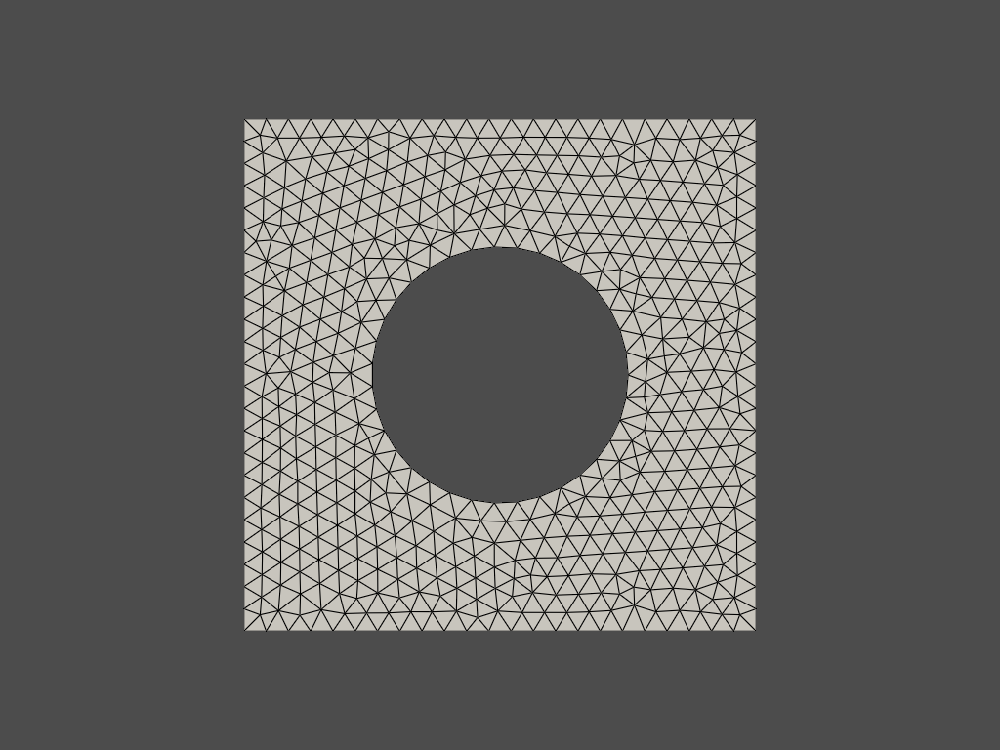

In [11]:
#Extraemos información necesaria para graficar la grilla
tdim = domain.topology.dim
topology, cell_types, geometry = plot.create_vtk_mesh(domain, tdim)
grid = pyvista.UnstructuredGrid(topology, cell_types, geometry)

#Inicializamos el grafico
plotter = pyvista.Plotter(notebook=True)
plotter.add_mesh(grid, show_edges=True)
plotter.view_xy()

plotter.show()

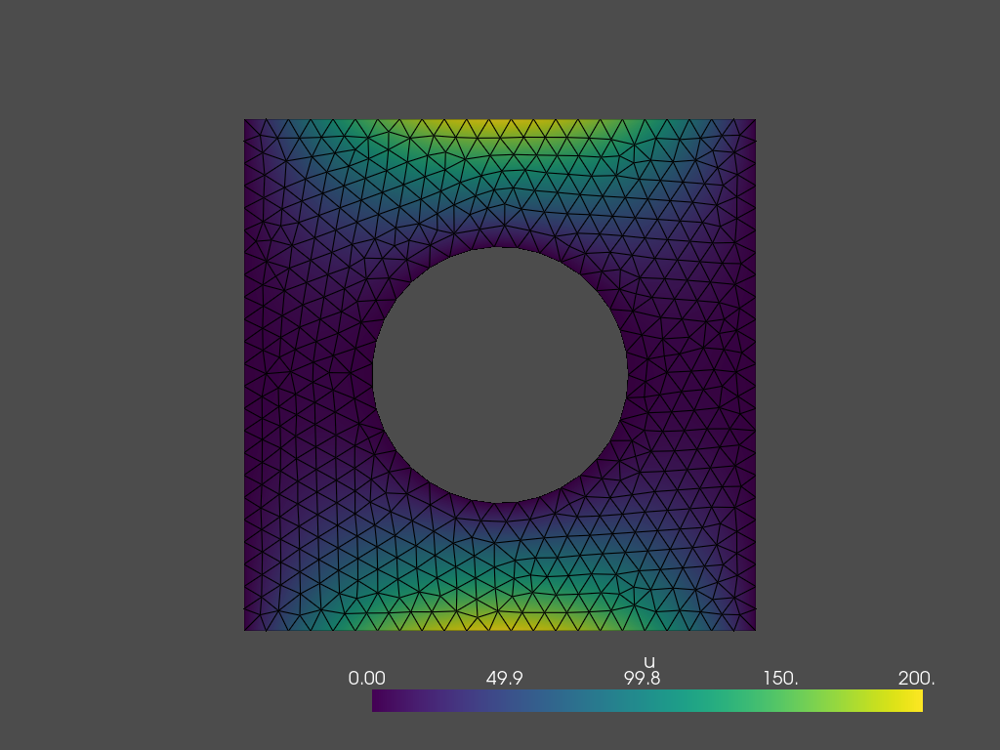

In [12]:
#Extraemos información del espacio funcional para graficar la solución
u_topology, u_cell_types, u_geometry = plot.create_vtk_mesh(V)

#Creamos la grilla de la función a evaluar
u_grid = pyvista.UnstructuredGrid(u_topology, u_cell_types, u_geometry)
u_grid.point_data["u"] = uh.x.array.real
u_grid.set_active_scalars("u")
u_plotter = pyvista.Plotter(notebook = True) #Importante el argumento notebook
u_plotter.add_mesh(u_grid, show_edges=True)
u_plotter.view_xy()

u_plotter.show()

#### Comentario:

Del gráfico obtenido se puede observar que la función toma valores mucho más grandes en la parte inferior y superior del dominio en comparación con el resto de zonas. Esto es consistente teniendo en cuenta las condiciones de borde. Además es posible notar que en la frontera de la crcunferencia que perfora el dominio, la función también toma valores pequeños cercanos al cero. 

Esto se puede interpretar como dos fuentes de calor que se encuentran en la parte inferior y superior de una habitación, la cuál posee una pared muy aislante en el centro que impide el paso del calor a tráves de esta. 

## Ejercicio 2

In [13]:
#Primero, inicializar gmsh
gmsh.clear()
gmsh.finalize()

gmsh.initialize()

#Parametros de la geometría
c_x = c_y = 0.0
r = 0.5
gdim = 2

#Elementos básicos
square = gmsh.model.occ.addRectangle(-1,-1,0, 2, 2, tag=1)
circle = gmsh.model.occ.addDisk(c_x, c_y, 0, r, r)

#"Restando" dominios
domain = gmsh.model.occ.cut([(gdim, square)], [(gdim, circle)])
gmsh.model.occ.synchronize()

#Definiendo la parte del dominio en la que se define la solución
volumes = gmsh.model.getEntities(dim=gdim)
status = gmsh.model.addPhysicalGroup(volumes[0][0], [volumes[0][1]], tag = 2)

#Fijando parametros de la grilla y generándola
gmsh.option.setNumber("Mesh.CharacteristicLengthMin",0.09)
gmsh.option.setNumber("Mesh.CharacteristicLengthMax",0.09)
gmsh.model.mesh.generate(gdim)

In [14]:
#Todo lo de esta celda sirve para pasar la malla desde gmsh hasta dolphinx
#solo importa si van a trabajar con multiprocesos, pero hay que correrlo igual.

if MPI.COMM_WORLD.rank == 0:
    # Get mesh geometry
    geometry_data = io.extract_gmsh_geometry(gmsh.model)
    # Get mesh topology for each element
    topology_data = io.extract_gmsh_topology_and_markers(gmsh.model)

# Extract the cell type and number of nodes per cell and broadcast
# it to the other processors 
if MPI.COMM_WORLD.rank == 0:
    # Extract the cell type and number of nodes per cell and broadcast
    # it to the other processors 
    gmsh_cell_type = list(topology_data.keys())[0]    
    properties = gmsh.model.mesh.getElementProperties(gmsh_cell_type)
    name, dim, order, num_nodes, local_coords, _ = properties
    cells = topology_data[gmsh_cell_type]["topology"]
    cell_id, num_nodes = MPI.COMM_WORLD.bcast([gmsh_cell_type, num_nodes], root=0)
else:        
    cell_id, num_nodes = MPI.COMM_WORLD.bcast([None, None], root=0)
    cells, geometry_data = np.empty([0, num_nodes]), np.empty([0, gdim])

# Permute topology data from MSH-ordering to dolfinx-ordering
ufl_domain = io.ufl_mesh_from_gmsh(cell_id, gdim)
gmsh_cell_perm = io.cell_perm_gmsh(cpp.mesh.to_type(str(ufl_domain.ufl_cell())), num_nodes)
cells = cells[:, gmsh_cell_perm]

In [15]:
# Generando el dominio
domain = mesh.create_mesh(MPI.COMM_WORLD, cells, geometry_data[:, :gdim], ufl_domain)
V = fem.FunctionSpace(domain, ("CG", 1))

def boundary_circle(x):
    return np.isclose( x[0]**2 + x[1]**2 - 0.5**2, 0)

#def boundary_square(x):
 #   return np.logical_or(np.isclose(abs(x[0]), 1), np.isclose(abs(x[1]), 1))

def superior(x):
    return np.isclose(x[1],1)

def inferior(x):
    return np.isclose(x[1],-1)

def lados(x):
    return np.logical_or(np.isclose(x[0], -1), np.isclose(x[0],1))

dofs_circle = fem.locate_dofs_geometrical(V, boundary_circle)
dofs_sup = fem.locate_dofs_geometrical(V, superior)
dofs_inf = fem.locate_dofs_geometrical(V, inferior)
dofs_lad = fem.locate_dofs_geometrical(V, lados)

In [16]:
#Condiciones de borde
g = fem.Function(V)
g.interpolate(lambda x: 200*(1-x[0]**2))
zero = fem.Function(V)
zero.interpolate(lambda x:  x[0]*0 )

In [17]:
#Definimos las condiciones (en este caso Dirichlet) asociadas a cada borde:
bc_sup = fem.dirichletbc(g, dofs_sup)
bc_inf = fem.dirichletbc(g, dofs_inf)
bc_lads = fem.dirichletbc(zero, dofs_lad)
#bc_circle = fem.dirichletbc(zero, dofs_circle)

#y las juntamos en una lista
bcs = [bc_sup, bc_inf, bc_lads]

In [18]:
#Formulacion variacional: definimos primero los elementos constituyentes de la
#formulación variacional
u = ufl.TrialFunction(V)
v = ufl.TestFunction(V)
f = fem.Constant(domain, ScalarType(0.0))
h = fem.Constant(domain, ScalarType(0.0))

#Definimos los operadores bilineales y lineales asociados
a_1=1
a = a_1*ufl.dot(ufl.grad(u), ufl.grad(v)) * ufl.dx
L = f * v * ufl.dx + h*v*ufl.ds

In [19]:
#Solucion
problem = fem.petsc.LinearProblem(a, L, bcs=bcs, petsc_options={"ksp_type": "preonly", "pc_type": "lu"})
uh = problem.solve()

In [20]:
#Extraemos información necesaria para graficar la grilla
tdim = domain.topology.dim
topology, cell_types, geometry = plot.create_vtk_mesh(domain, tdim)
grid = pyvista.UnstructuredGrid(topology, cell_types, geometry)

#Inicializamos el grafico
plotter = pyvista.Plotter(notebook=True)
plotter.add_mesh(grid, show_edges=True)
plotter.view_xy()

#plotter.show()

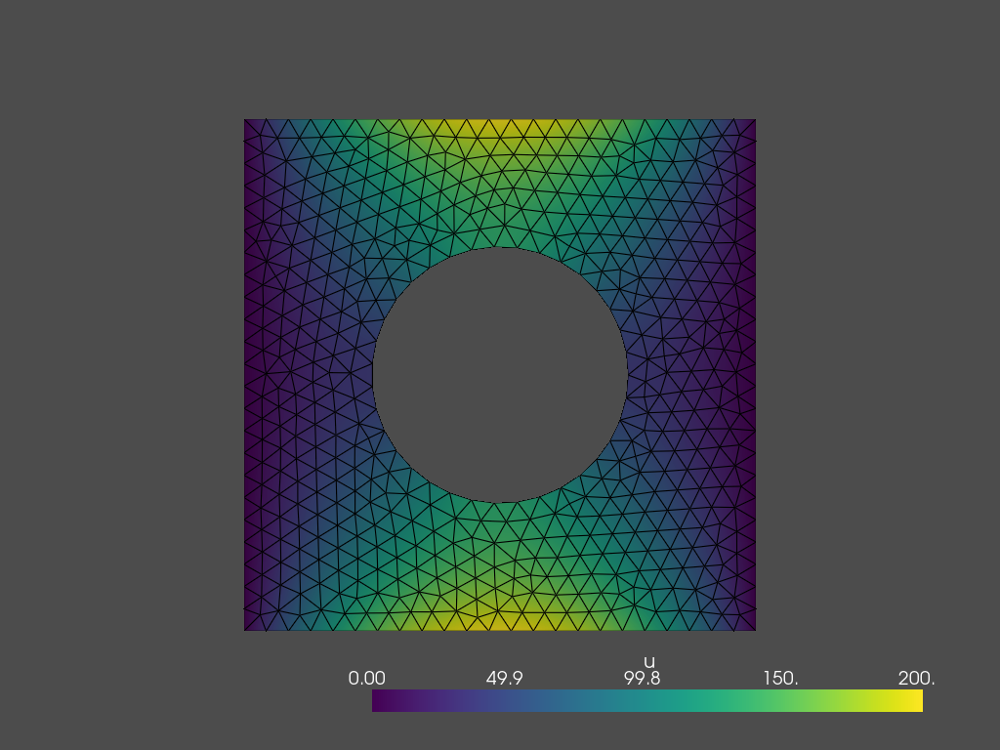

In [21]:
#Extraemos información del espacio funcional para graficar la solución
u_topology, u_cell_types, u_geometry = plot.create_vtk_mesh(V)

#Creamos la grilla de la función a evaluar
u_grid = pyvista.UnstructuredGrid(u_topology, u_cell_types, u_geometry)
u_grid.point_data["u"] = uh.x.array.real
u_grid.set_active_scalars("u")
u_plotter = pyvista.Plotter(notebook = True) #Importante el argumento notebook
u_plotter.add_mesh(u_grid, show_edges=True)
u_plotter.view_xy()

u_plotter.show()

### Parte b)

In [22]:
def graficar(a_,b_,a_1,r, malla):
  gmsh.clear()
  gmsh.finalize()
  gmsh.initialize()

  #Parametros de la geometría
  c_x = a_
  c_y = b_
  gdim = 2

  #Elementos básicos
  square = gmsh.model.occ.addRectangle(-1,-1,0, 2, 2, tag=1)
  circle = gmsh.model.occ.addDisk(c_x, c_y, 0, r, r)

  #"Restando" dominios
  domain = gmsh.model.occ.cut([(gdim, square)], [(gdim, circle)])
  gmsh.model.occ.synchronize()

  #Definiendo la parte del dominio en la que se define la solución
  volumes = gmsh.model.getEntities(dim=gdim)
  status = gmsh.model.addPhysicalGroup(volumes[0][0], [volumes[0][1]], tag = 2)

  #Fijando parametros de la grilla y generándola
  gmsh.option.setNumber("Mesh.CharacteristicLengthMin",malla)
  gmsh.option.setNumber("Mesh.CharacteristicLengthMax",malla)
  gmsh.model.mesh.generate(gdim)

    #Todo lo de esta celda sirve para pasar la malla desde gmsh hasta dolphinx
  #solo importa si van a trabajar con multiprocesos, pero hay que correrlo igual.

  if MPI.COMM_WORLD.rank == 0:
      # Get mesh geometry
      geometry_data = io.extract_gmsh_geometry(gmsh.model)
      # Get mesh topology for each element
      topology_data = io.extract_gmsh_topology_and_markers(gmsh.model)

  # Extract the cell type and number of nodes per cell and broadcast
  # it to the other processors 
  if MPI.COMM_WORLD.rank == 0:
      # Extract the cell type and number of nodes per cell and broadcast
      # it to the other processors 
      gmsh_cell_type = list(topology_data.keys())[0]    
      properties = gmsh.model.mesh.getElementProperties(gmsh_cell_type)
      name, dim, order, num_nodes, local_coords, _ = properties
      cells = topology_data[gmsh_cell_type]["topology"]
      cell_id, num_nodes = MPI.COMM_WORLD.bcast([gmsh_cell_type, num_nodes], root=0)
  else:        
      cell_id, num_nodes = MPI.COMM_WORLD.bcast([None, None], root=0)
      cells, geometry_data = np.empty([0, num_nodes]), np.empty([0, gdim])

  # Permute topology data from MSH-ordering to dolfinx-ordering
  ufl_domain = io.ufl_mesh_from_gmsh(cell_id, gdim)
  gmsh_cell_perm = io.cell_perm_gmsh(cpp.mesh.to_type(str(ufl_domain.ufl_cell())), num_nodes)
  cells = cells[:, gmsh_cell_perm]

    # Generando el dominio
  domain = mesh.create_mesh(MPI.COMM_WORLD, cells, geometry_data[:, :gdim], ufl_domain)
  V = fem.FunctionSpace(domain, ("CG", 1))

  def boundary_circle(x,R=r):
      return np.isclose( (x[0]-c_x)**2 + (x[1]-c_y)**2 - R**2, 0)

  def superior(x):
      return np.isclose(x[1],1)

  def inferior(x):
      return np.isclose(x[1],-1)

  def lados(x):
      return np.logical_or(np.isclose(x[0], -1), np.isclose(x[0],1))

  dofs_circle = fem.locate_dofs_geometrical(V, boundary_circle)
  dofs_sup = fem.locate_dofs_geometrical(V, superior)
  dofs_inf = fem.locate_dofs_geometrical(V, inferior)
  dofs_lad = fem.locate_dofs_geometrical(V, lados)

  #Condiciones de borde
  g = fem.Function(V)
  g.interpolate(lambda x: 200*(1-x[0]**2))
  zero = fem.Function(V)
  zero.interpolate(lambda x:  x[0]*0 )

  #Definimos las condiciones (en este caso Dirichlet) asociadas a cada borde:
  bc_sup = fem.dirichletbc(g, dofs_sup)
  bc_inf = fem.dirichletbc(g, dofs_inf)
  bc_lads = fem.dirichletbc(zero, dofs_lad)
  #bc_circle = fem.dirichletbc(zero, dofs_circle)

  #y las juntamos en una lista
  bcs = [bc_sup, bc_inf, bc_lads]

    #Formulacion variacional: definimos primero los elementos constituyentes de la
  #formulación variacional
  u = ufl.TrialFunction(V)
  v = ufl.TestFunction(V)
  f = fem.Constant(domain, ScalarType(0.0))
  h = fem.Constant(domain, ScalarType(0.0))

  #Definimos los operadores bilineales y lineales asociados
  a = a_1*ufl.dot(ufl.grad(u), ufl.grad(v)) * ufl.dx
  L = f * v * ufl.dx + h*v*ufl.ds

    #Solucion
  problem = fem.petsc.LinearProblem(a, L, bcs=bcs, petsc_options={"ksp_type": "preonly", "pc_type": "lu"})
  uh = problem.solve()

  #Se extrae los valores de la función que restringida al borde de la circunferencia
  y=uh.x.array.real
  media=[]
  for j in dofs_circle:
    media.append(y[j])
  temperatura_media=np.mean(np.array(media)) #Se calcula la temperatura media

  #Extraemos información necesaria para graficar la grilla
  tdim = domain.topology.dim
  topology, cell_types, geometry = plot.create_vtk_mesh(domain, tdim)
  grid = pyvista.UnstructuredGrid(topology, cell_types, geometry)

  #Inicializamos el grafico
  #plotter = pyvista.Plotter(notebook=True)
  #plotter.add_mesh(grid, show_edges=True)
  #plotter.view_xy()

  #plotter.show()

    #Extraemos información del espacio funcional para graficar la solución
  u_topology, u_cell_types, u_geometry = plot.create_vtk_mesh(V)

  #Creamos la grilla de la función a evaluar
  u_grid = pyvista.UnstructuredGrid(u_topology, u_cell_types, u_geometry)
  u_grid.point_data["u"] = uh.x.array.real
  u_grid.set_active_scalars("u")
  u_plotter = pyvista.Plotter(notebook = True) #Importante el argumento notebook
  u_plotter.add_mesh(u_grid, show_edges=True)
  u_plotter.view_xy()

  u_plotter.show()
  return temperatura_media

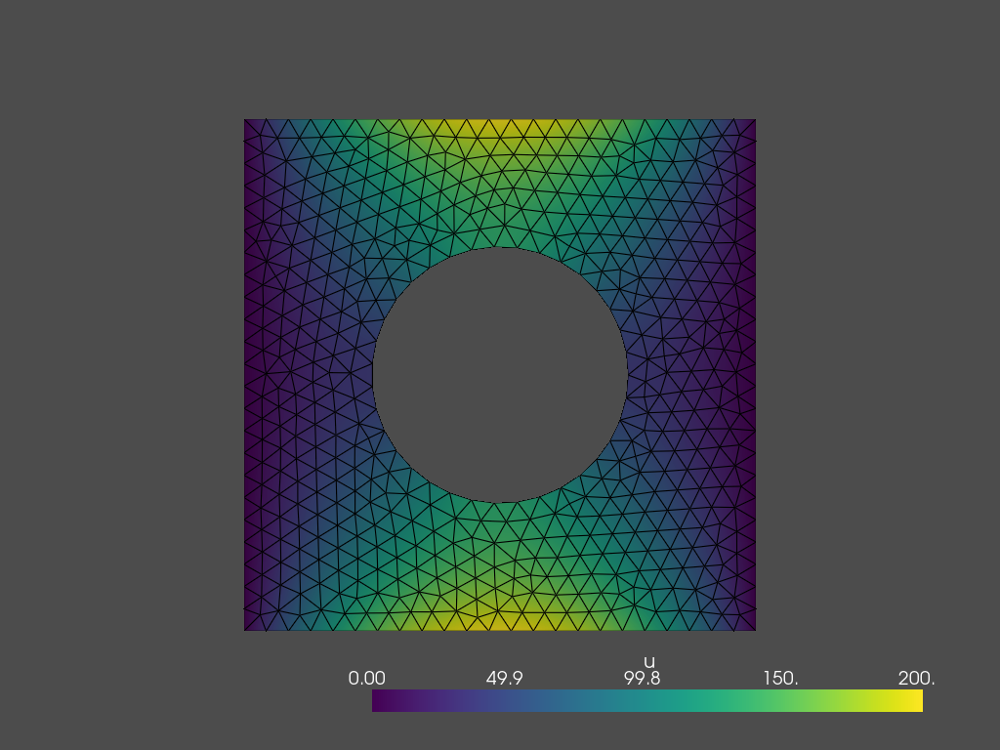

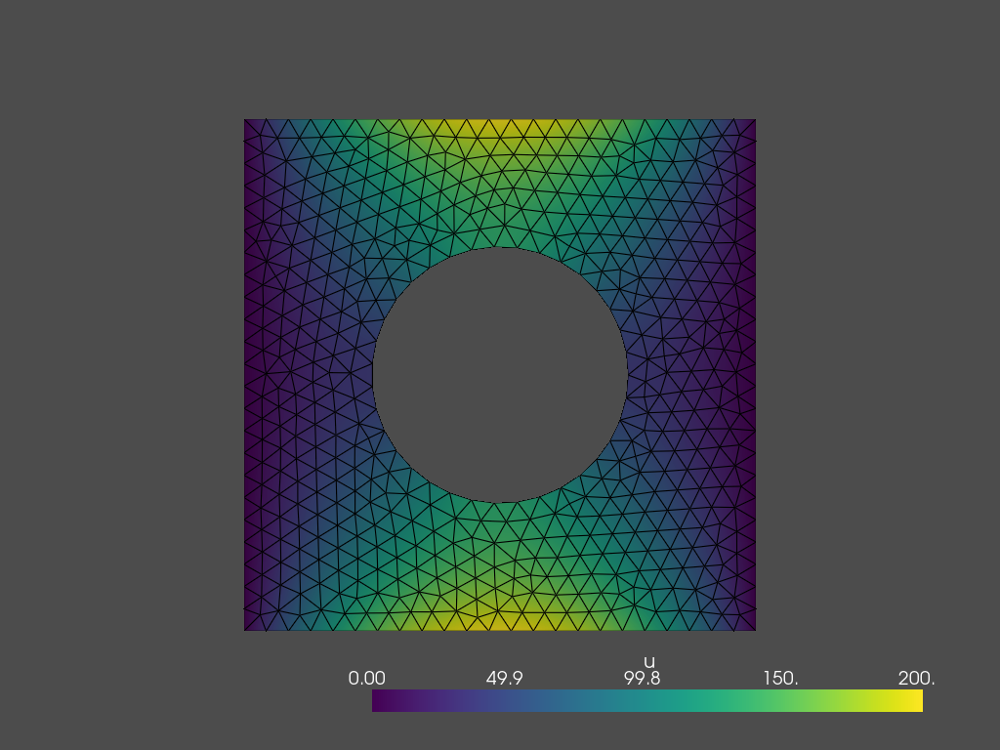

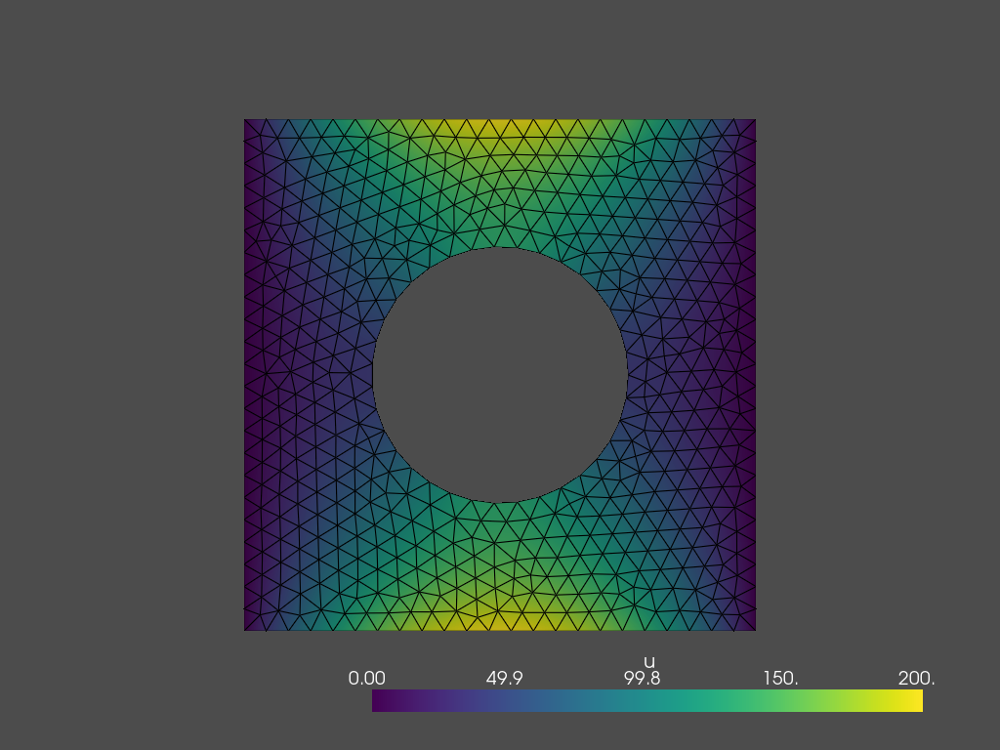

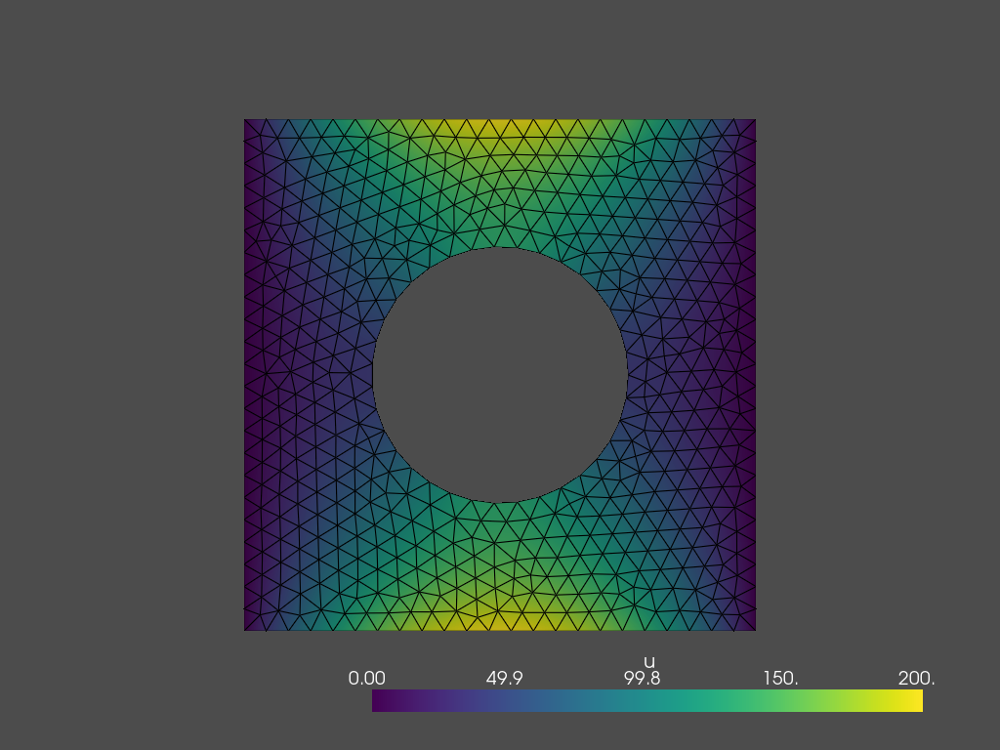

In [23]:
A1=[1,10,20,100]
for a_1 in A1:
  graficar(0,0,a_1,0.5,0.09)

#### Comentario:
En este caso se puede observar que el valor de $a_1$ no afecta a la solución. Esto se debe a que al ser una constante positiva, se puede sacar de la ecuación, obteniendo de esta manera la ecuación $-div(a_1\Delta u) = 0$ en $\Omega ~$   en todos los casos. 

### Parte c)

### 1.-

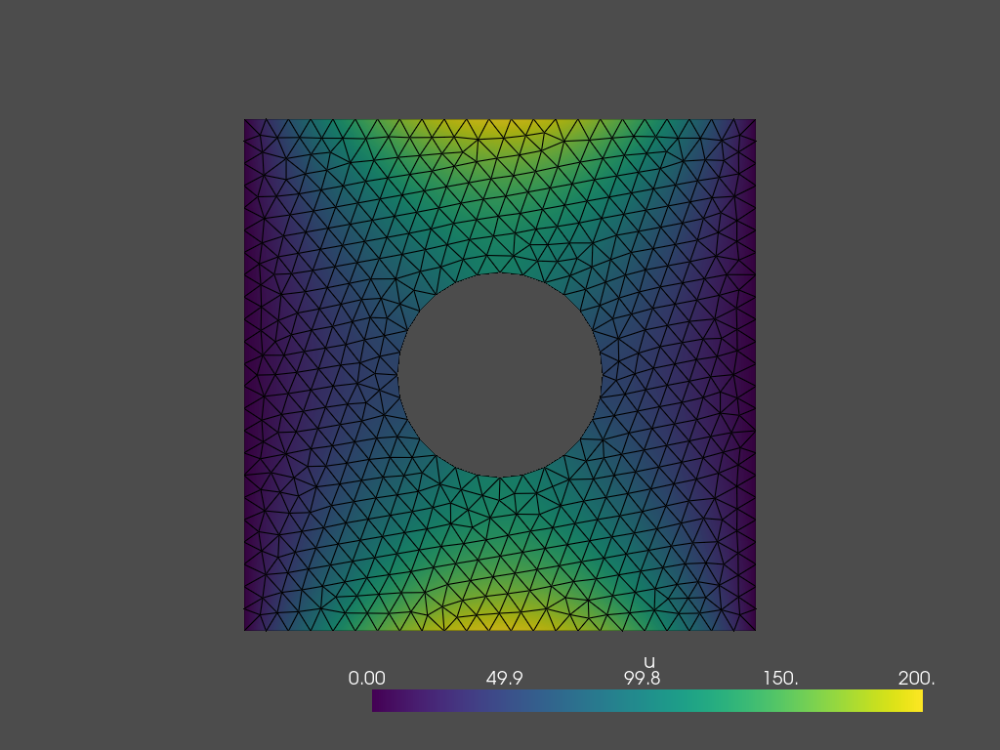

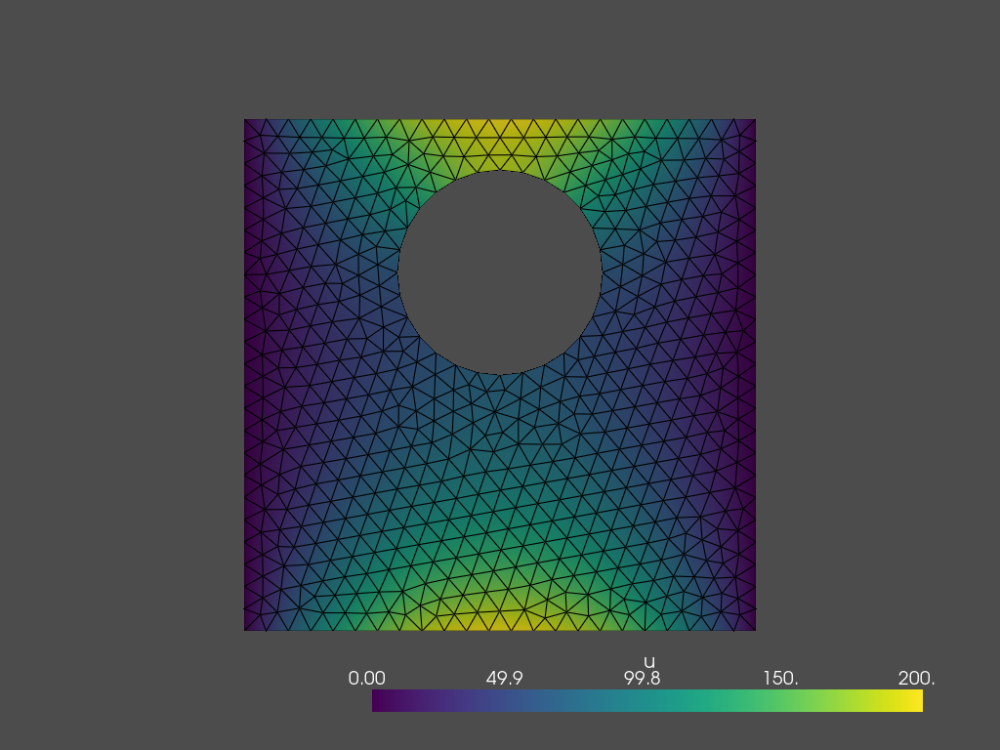

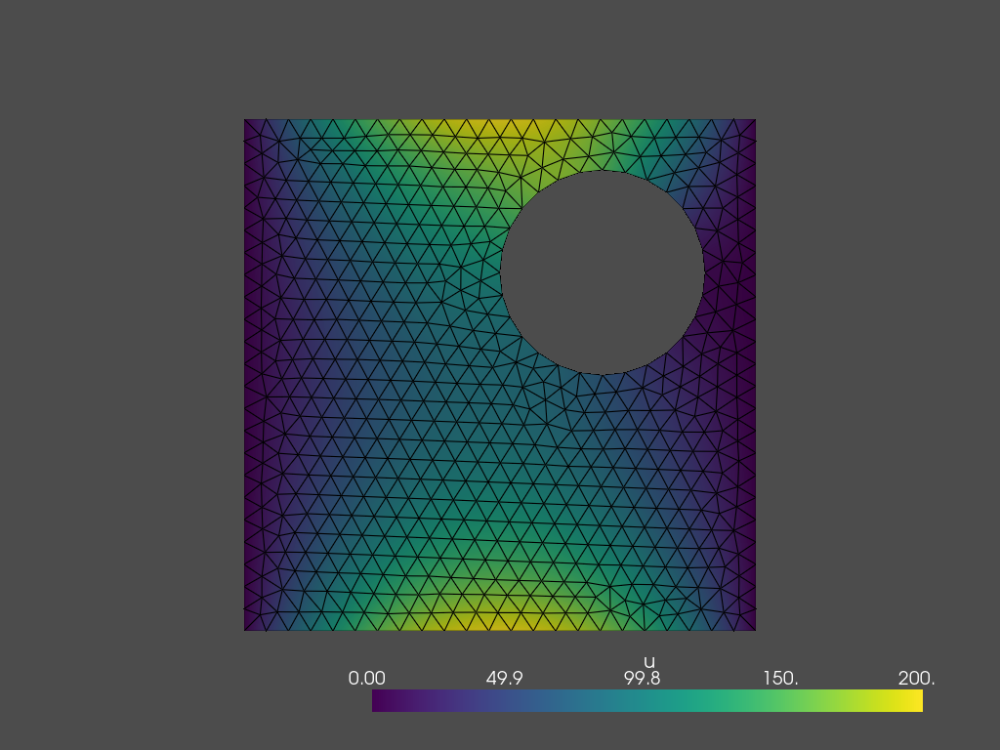

In [24]:
centros=[(0,0),(0,0.4),(0.4,0.4)]

Temperatura_media=[]
for c in centros:
  t=graficar(c[0],c[1],1,0.4,0.09)
  Temperatura_media.append(t)

In [25]:
df=pd.DataFrame()
df['centro']=centros
df['Temperatura_media']=Temperatura_media
df

,centro,Temperatura_media
0,"(0, 0)",82.122514
1,"(0, 0.4)",92.623357
2,"(0.4, 0.4)",80.711014


#### Comentario:
Se observa que el centro del circulo afecta significativamente el valor de la temperatura media. De los gráficos obtenidos se puede apreciar que entre más cerca esté el círculo de la fuente de calor, la temperatura alrededor de esta zona será mucho mayor en comparación a loss otros casos, causando que el promdeio de la tmeperatura suba. 

### 2.-

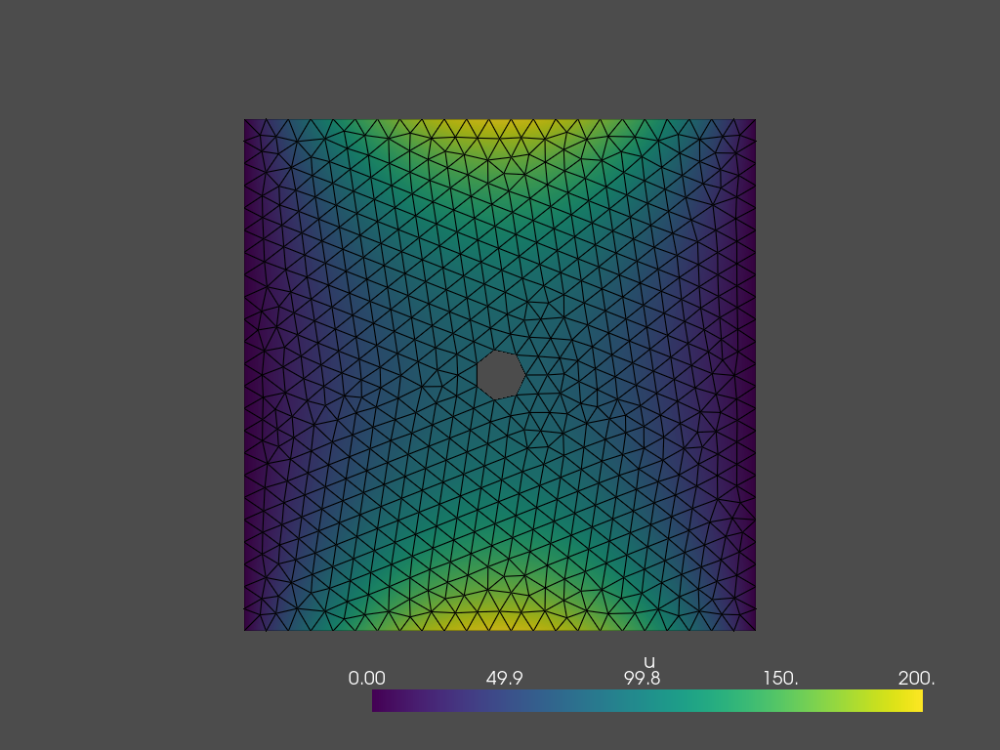

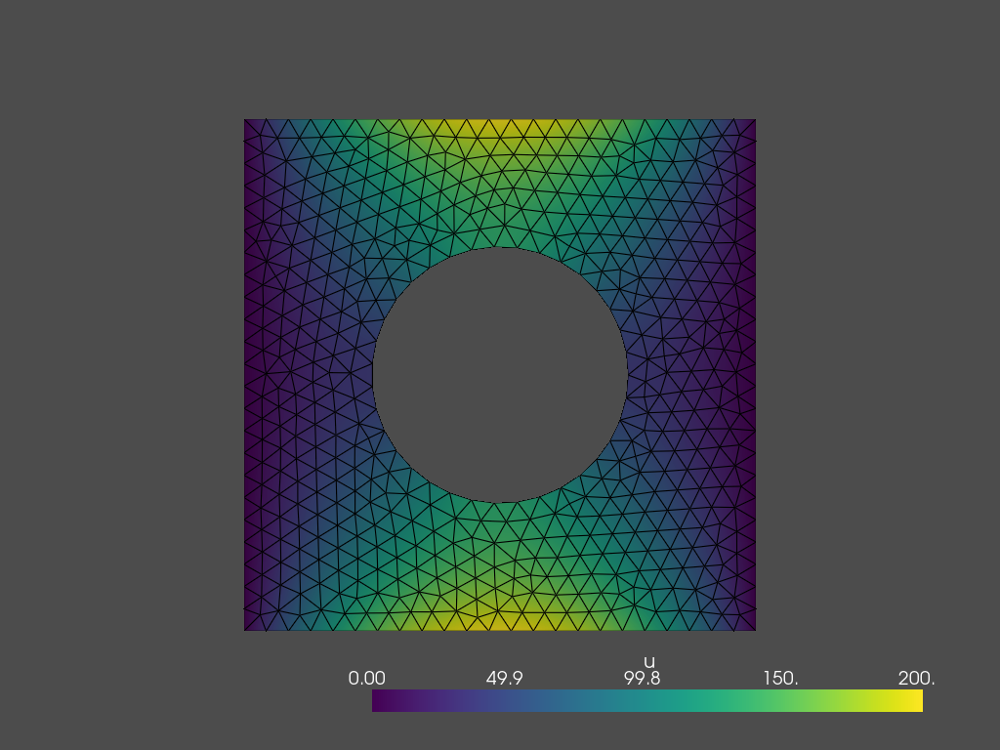

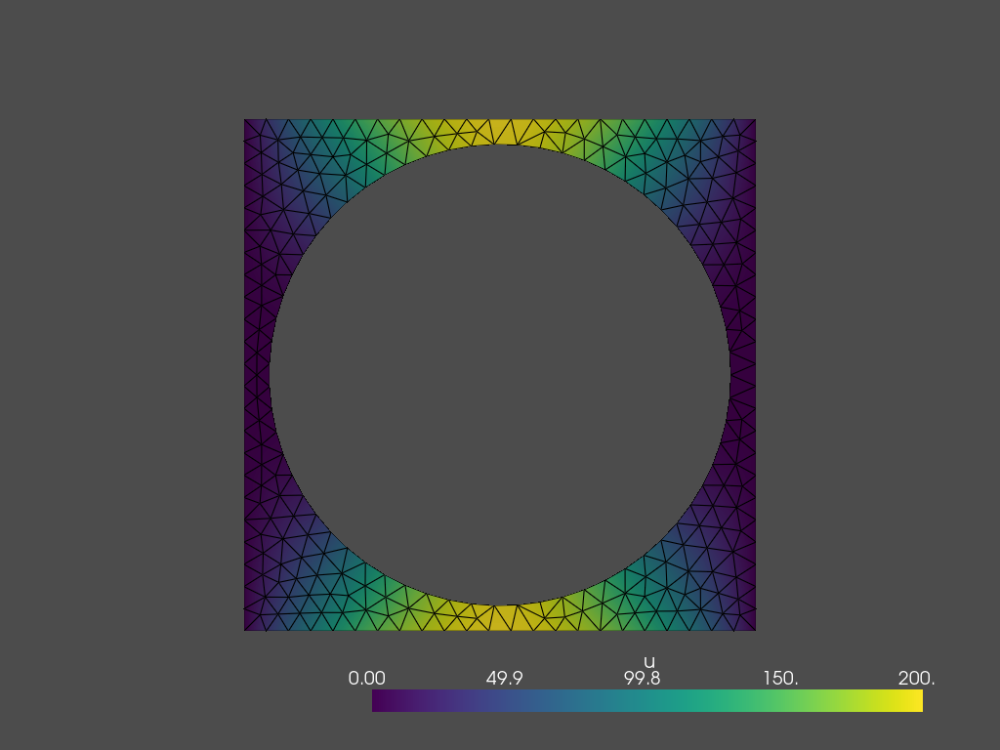

In [26]:
radios=[0.1,0.5,0.9]
Temperatura_media=[]
for r in radios:
  t=graficar(0,0,1,r,0.09)
  Temperatura_media.append(t)

In [27]:
df=pd.DataFrame()
df['radios']=radios
df['Temperatura_media']=Temperatura_media
df

,radios,Temperatura_media
0,0.1,82.122739
1,0.5,82.103185
2,0.9,80.246611


#### Comentario:
Se puede apreciar que a medida que el radio aumenta de tamaño, las condiciones de borde tienen mayor incidencia en el valor de la temperatura media de la frontera, provocando que esta decrezca debido a que la generación de calor es una función dependiente de $x$ y a que la temperatura mínima es homogénea a lo largo de ambos bordes laterales. De esta forma, existen zonas de menor temperatura en comparación a las de mayor calor. 



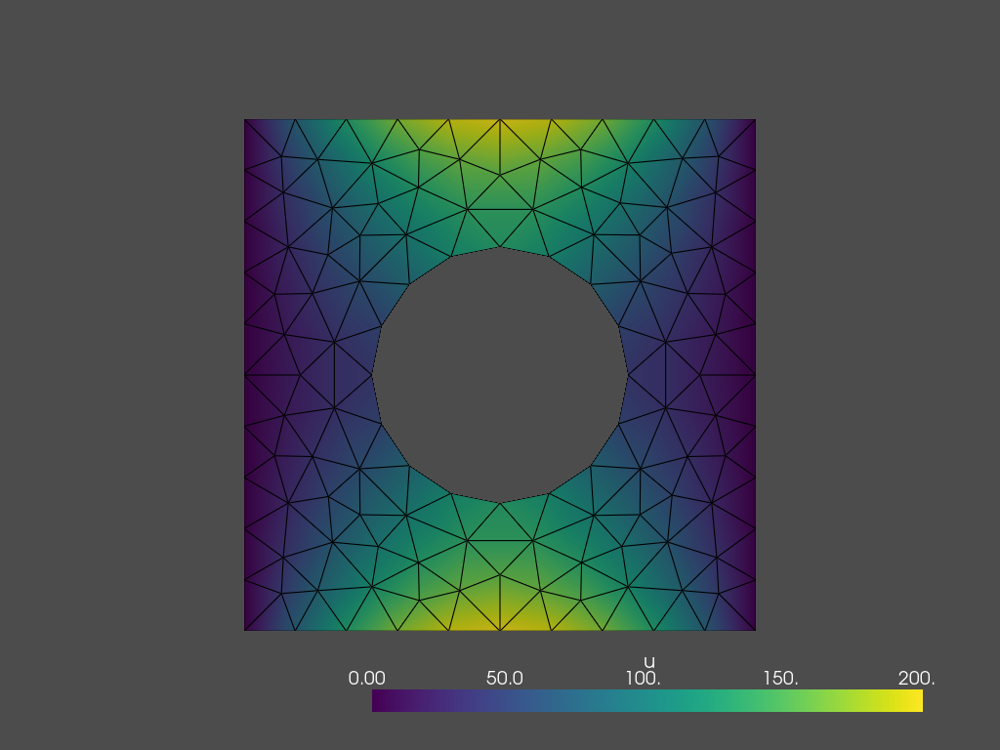

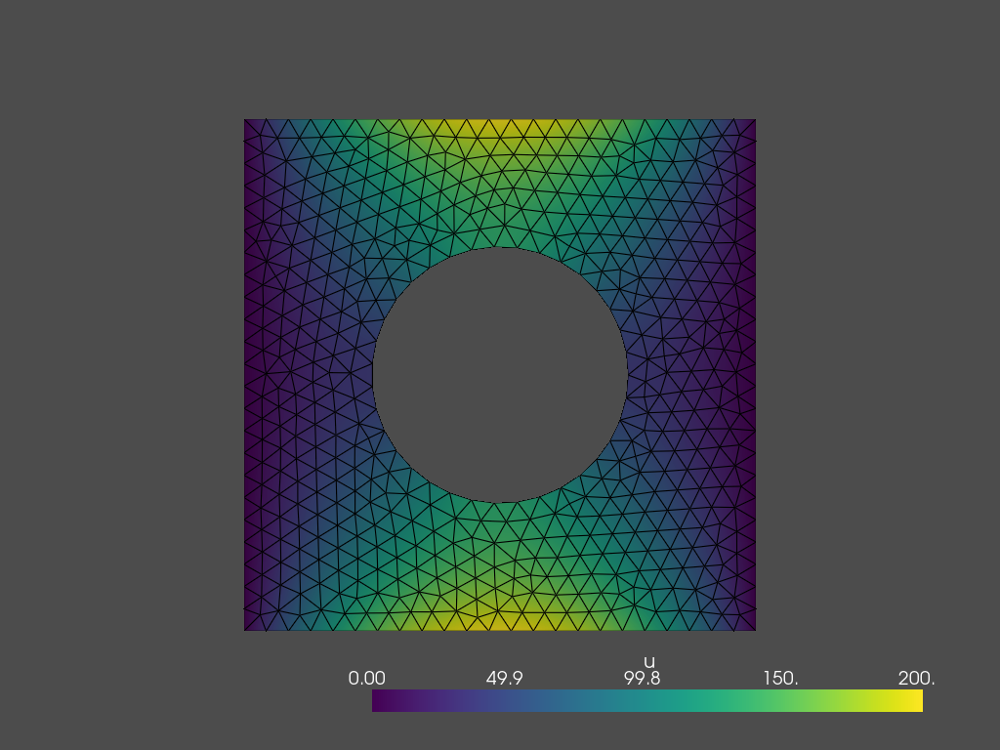

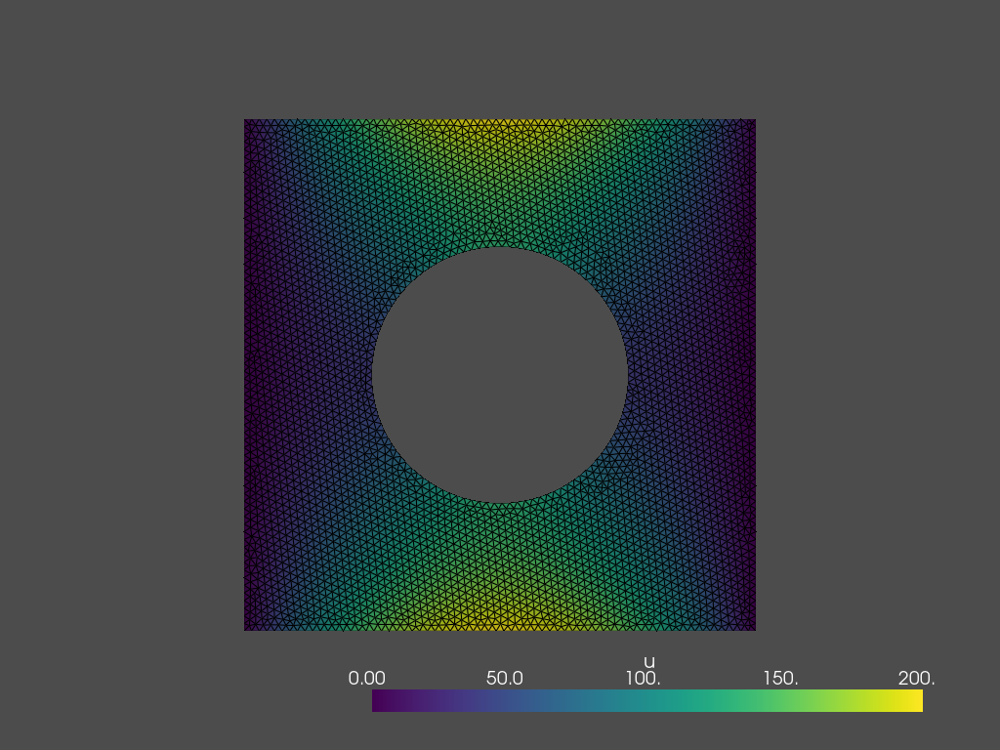

In [28]:
mallas=[0.2,0.09,0.03]
Temperatura_media=[]
for m in mallas:
  t=graficar(0,0,1,0.5,m)
  Temperatura_media.append(t)

In [29]:
df=pd.DataFrame()
df['ancho_elemento']=mallas
df['Temperatura_media']=Temperatura_media
df

,ancho_elemento,Temperatura_media
0,0.20,82.057701
1,0.09,82.103185
2,0.03,82.104767


#### Comentario: 

Se puede observar que al afinar el tamaño de la malla, se obtiene una aproximación más exacta de la temperatura media. De todas maneras, no es necesario usar una malla demasiado fina para obtener un valor aceptable, de hecho, el programa tarda demasiado en ejecutarse si el ancho es menor que 0.01. 

## Ejercicio 3

### Parte a)

In [30]:
def resolver_p3(a_,b_,a_1,a_2,r, malla):
  gmsh.clear()
  gmsh.finalize()
  gmsh.initialize()

  #Parametros de la geometría
  c_x = a_
  c_y = b_
  gdim = 2

  #Elementos básicos
  domain = gmsh.model.occ.addRectangle(-1,-1,0, 2, 2, tag=1)
  gmsh.model.occ.synchronize()

  #Definiendo la parte del dominio en la que se define la solución
  volumes = gmsh.model.getEntities(dim=gdim)
  status = gmsh.model.addPhysicalGroup(volumes[0][0], [volumes[0][1]], tag = 2)

  #Fijando parametros de la grilla y generándola
  gmsh.option.setNumber("Mesh.CharacteristicLengthMin",malla)
  gmsh.option.setNumber("Mesh.CharacteristicLengthMax",malla)
  gmsh.model.mesh.generate(gdim)

    #Todo lo de esta celda sirve para pasar la malla desde gmsh hasta dolphinx
  #solo importa si van a trabajar con multiprocesos, pero hay que correrlo igual.

  if MPI.COMM_WORLD.rank == 0:
      # Get mesh geometry
      geometry_data = io.extract_gmsh_geometry(gmsh.model)
      # Get mesh topology for each element
      topology_data = io.extract_gmsh_topology_and_markers(gmsh.model)

  # Extract the cell type and number of nodes per cell and broadcast
  # it to the other processors 
  if MPI.COMM_WORLD.rank == 0:
      # Extract the cell type and number of nodes per cell and broadcast
      # it to the other processors 
      gmsh_cell_type = list(topology_data.keys())[0]    
      properties = gmsh.model.mesh.getElementProperties(gmsh_cell_type)
      name, dim, order, num_nodes, local_coords, _ = properties
      cells = topology_data[gmsh_cell_type]["topology"]
      cell_id, num_nodes = MPI.COMM_WORLD.bcast([gmsh_cell_type, num_nodes], root=0)
  else:        
      cell_id, num_nodes = MPI.COMM_WORLD.bcast([None, None], root=0)
      cells, geometry_data = np.empty([0, num_nodes]), np.empty([0, gdim])

  # Permute topology data from MSH-ordering to dolfinx-ordering
  ufl_domain = io.ufl_mesh_from_gmsh(cell_id, gdim)
  gmsh_cell_perm = io.cell_perm_gmsh(cpp.mesh.to_type(str(ufl_domain.ufl_cell())), num_nodes)
  cells = cells[:, gmsh_cell_perm]

    # Generando el dominio
  domain = mesh.create_mesh(MPI.COMM_WORLD, cells, geometry_data[:, :gdim], ufl_domain)
  V = fem.FunctionSpace(domain, ("CG", 1))

  def superior(x):
      return np.isclose(x[1],1)

  def inferior(x):
      return np.isclose(x[1],-1)

  def lados(x):
      return np.logical_or(np.isclose(x[0], -1), np.isclose(x[0],1))

  dofs_sup = fem.locate_dofs_geometrical(V, superior)
  dofs_inf = fem.locate_dofs_geometrical(V, inferior)
  dofs_lad = fem.locate_dofs_geometrical(V, lados)

  #Condiciones de borde
  g = fem.Function(V)
  g.interpolate(lambda x: 200*(1-x[0]**2))
  zero = fem.Function(V)
  zero.interpolate(lambda x:  x[0]*0 )

  #Definimos las condiciones (en este caso Dirichlet) asociadas a cada borde:
  bc_sup = fem.dirichletbc(g, dofs_sup)
  bc_inf = fem.dirichletbc(g, dofs_inf)
  bc_lads = fem.dirichletbc(zero, dofs_lad)

  #y las juntamos en una lista
  bcs = [bc_sup, bc_inf, bc_lads]

  #Formulacion variacional: definimos primero los elementos constituyentes de la formulación variacional
  u = ufl.TrialFunction(V)
  v = ufl.TestFunction(V)
  f = fem.Constant(domain, ScalarType(0.0))

  #Función A
  A = fem.Function(V)
  A.interpolate(lambda x: np.where((x[0]-c_x)**2 + (x[1]-c_y)**2 < r**2 ,a_2,a_1))

  #Definimos los operadores bilineales y lineales asociados
  #a = ufl.dot(A,ufl.dot(ufl.grad(u), ufl.grad(v))) * ufl.dx
  a = ufl.dot(A*ufl.grad(u), ufl.grad(v)) * ufl.dx
  L = f * v * ufl.dx

    #Solucion
  problem = fem.petsc.LinearProblem(a, L, bcs=bcs, petsc_options={"ksp_type": "preonly", "pc_type": "lu"})
  uh = problem.solve()

  #Extraemos información necesaria para graficar la grilla
  tdim = domain.topology.dim
  topology, cell_types, geometry = plot.create_vtk_mesh(domain, tdim)
  grid = pyvista.UnstructuredGrid(topology, cell_types, geometry)

  #Inicializamos el grafico
  plotter = pyvista.Plotter(notebook=True)
  plotter.add_mesh(grid, show_edges=True)
  plotter.view_xy()

  #plotter.show()

    #Extraemos información del espacio funcional para graficar la solución
  u_topology, u_cell_types, u_geometry = plot.create_vtk_mesh(V)

  #Creamos la grilla de la función a evaluar
  u_grid = pyvista.UnstructuredGrid(u_topology, u_cell_types, u_geometry)
  u_grid.point_data["u"] = uh.x.array.real
  u_grid.set_active_scalars("u")
  u_plotter = pyvista.Plotter(notebook = True) #Importante el argumento notebook
  u_plotter.add_mesh(u_grid, show_edges=True)
  u_plotter.view_xy()

  u_plotter.show()


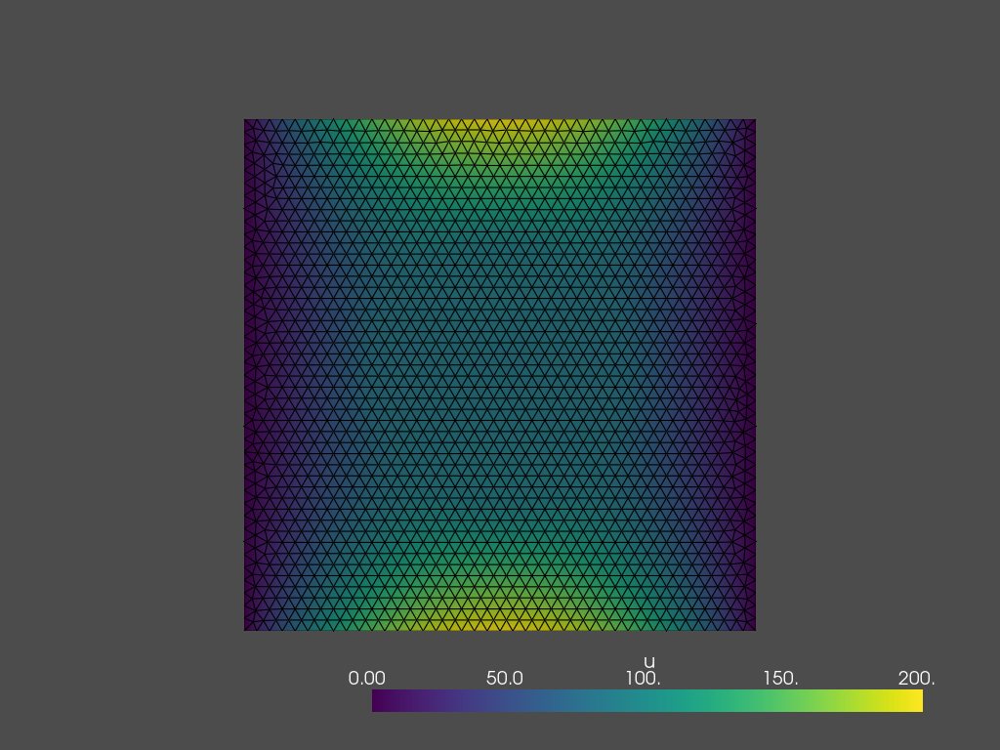

In [31]:
resolver_p3(0,0,1,10,0.5, 0.05)

#### Comentario:

Se puede observar que al ser $a_2$ mayor que $a_1$, la transferencia de calor es mayor en $\Omega$ que en $\Omega_2$. Esto se puede notar en que la solución tiene un comportamiento más homogéneo en $\Omega_2$ que en el resto de la grilla.


### Parte b)

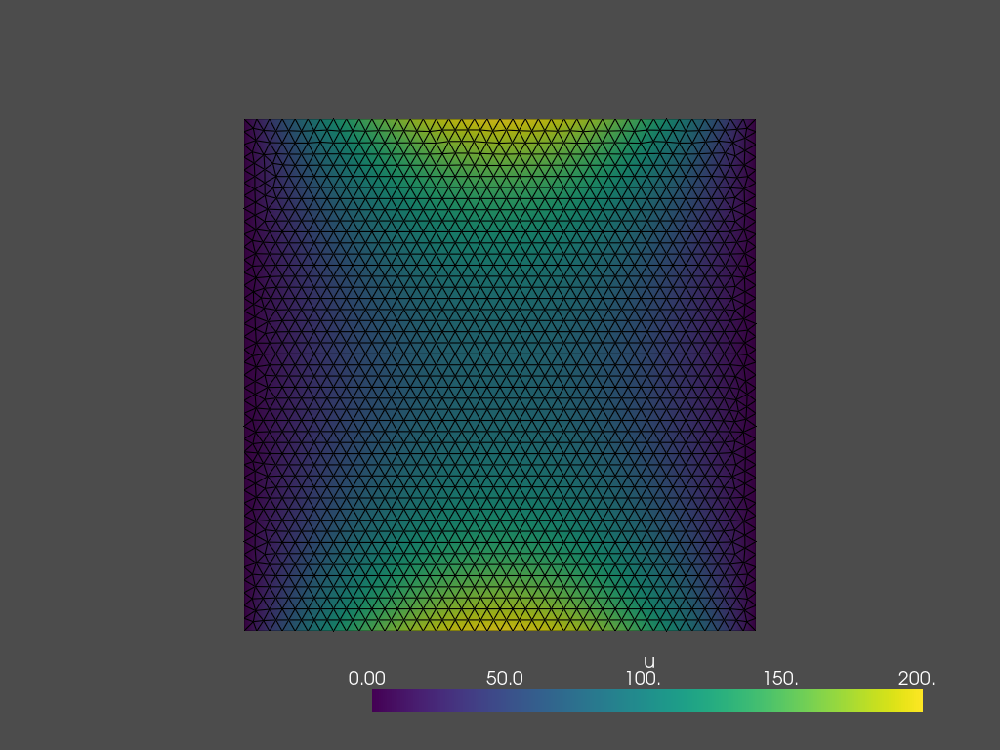

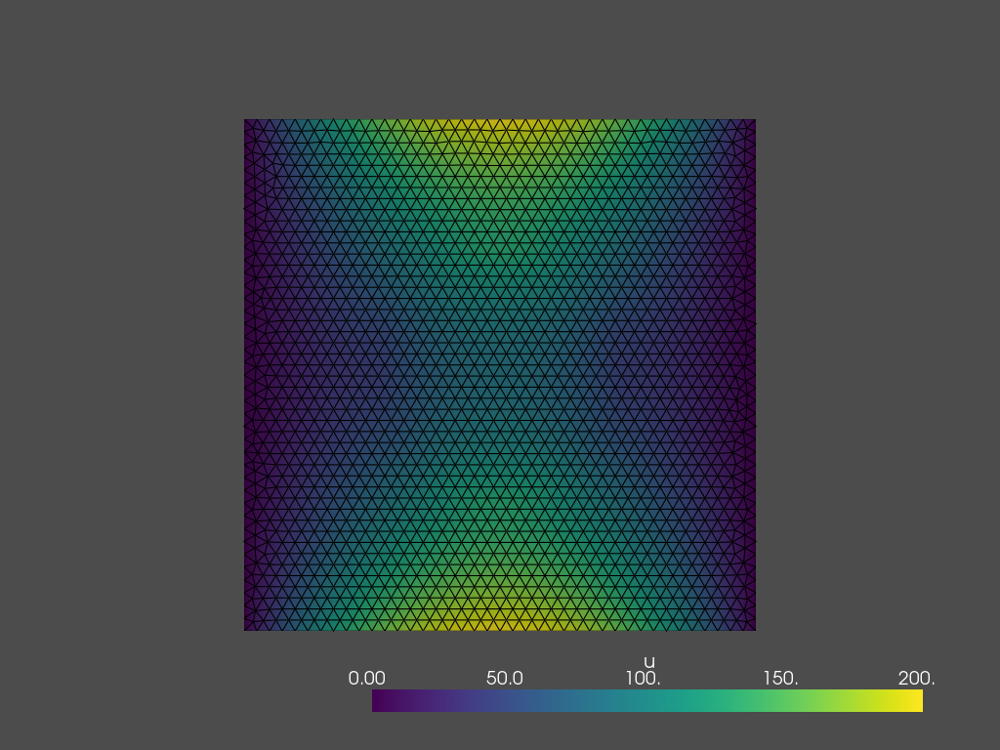

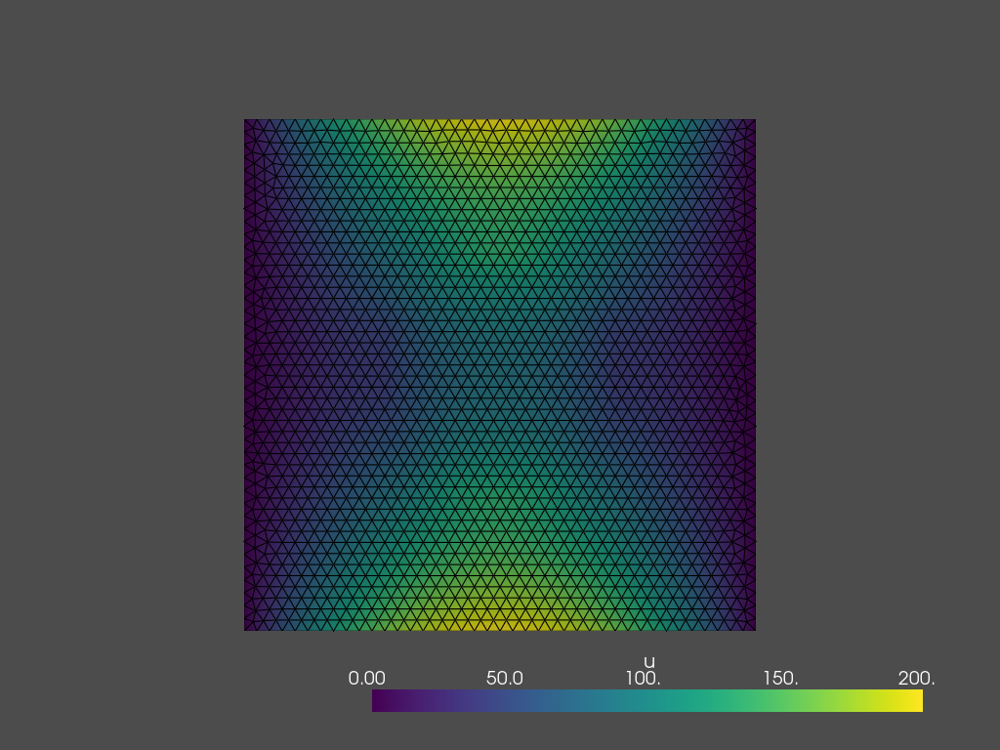

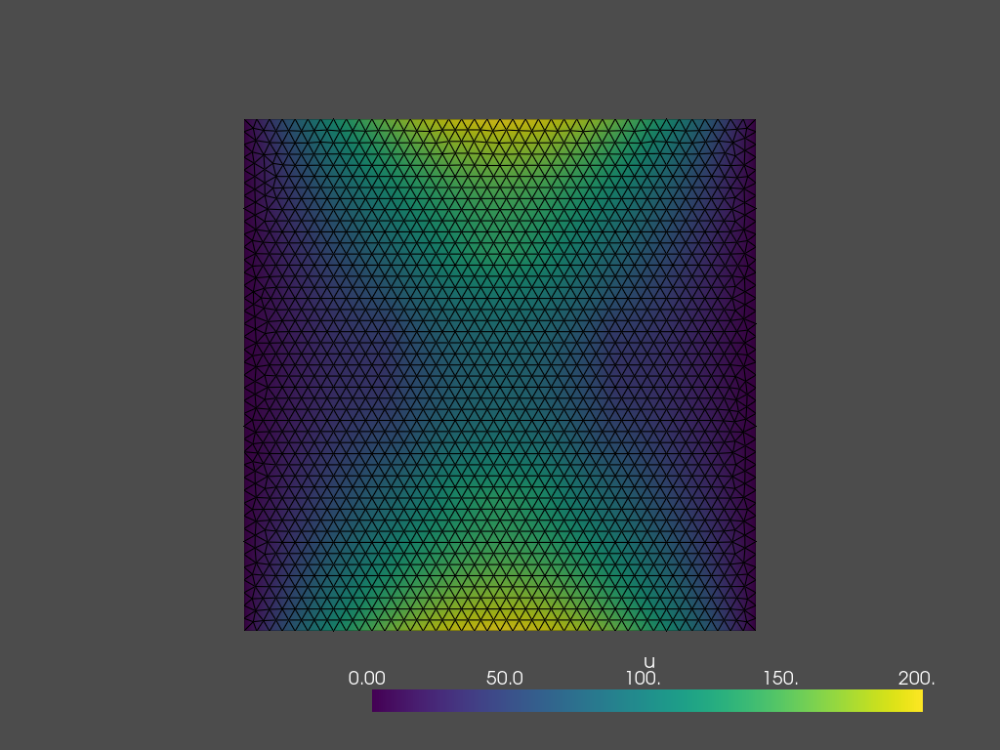

In [32]:
a2_decrecientes=[1,0.1,0.005,0.000000001]
for k in a2_decrecientes:
  resolver_p3(0,0,1,k,0.5, 0.05)

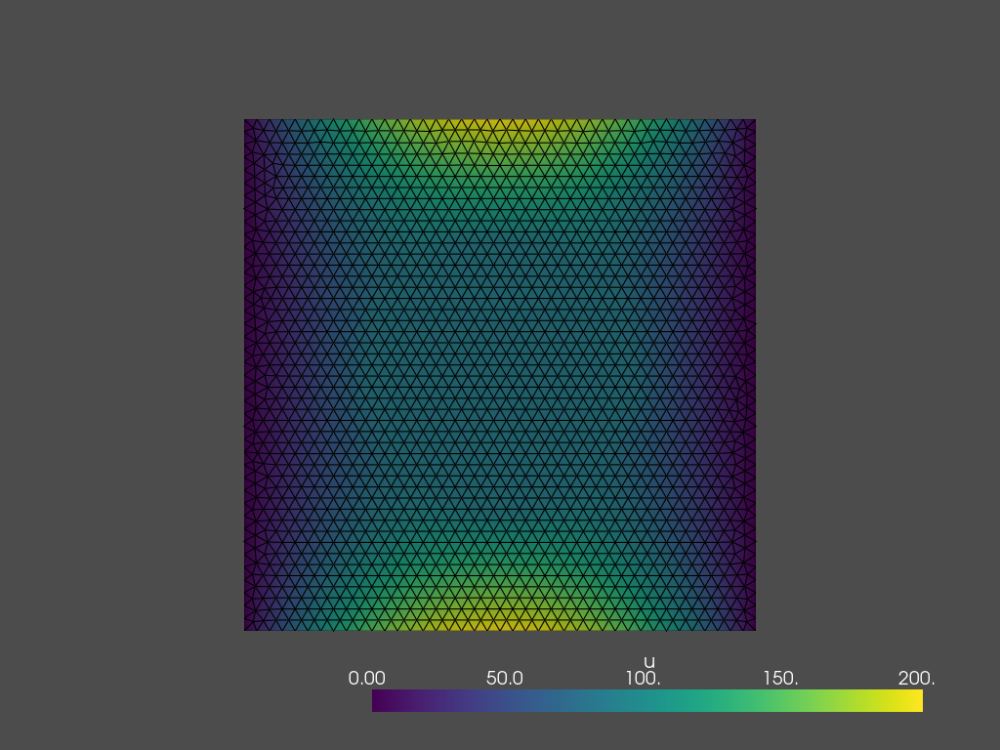

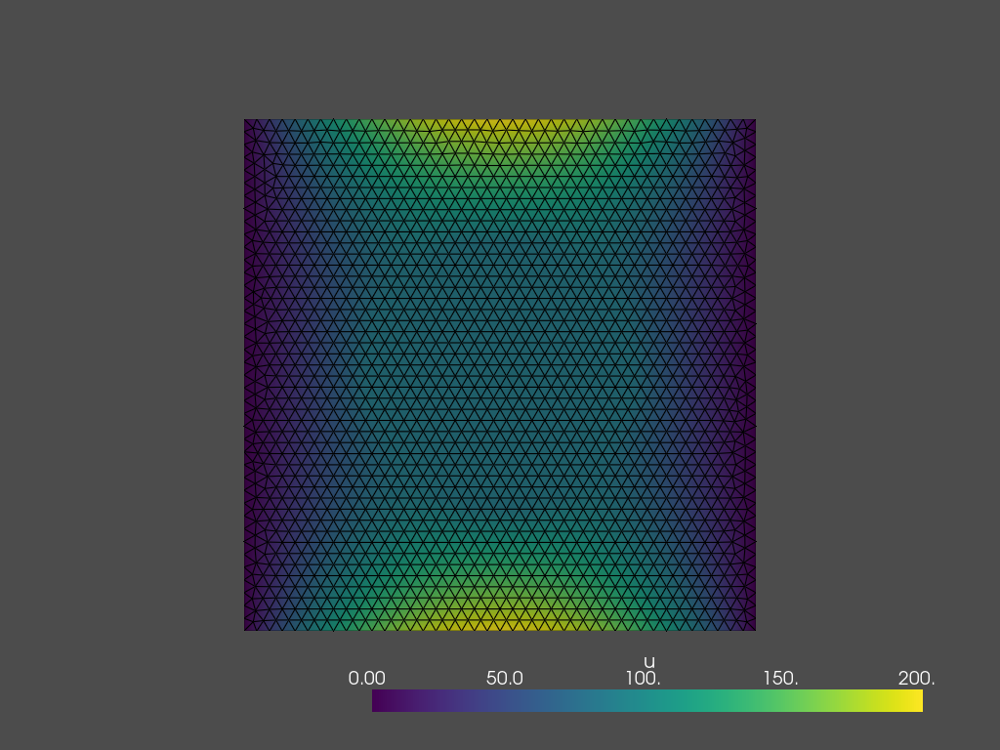

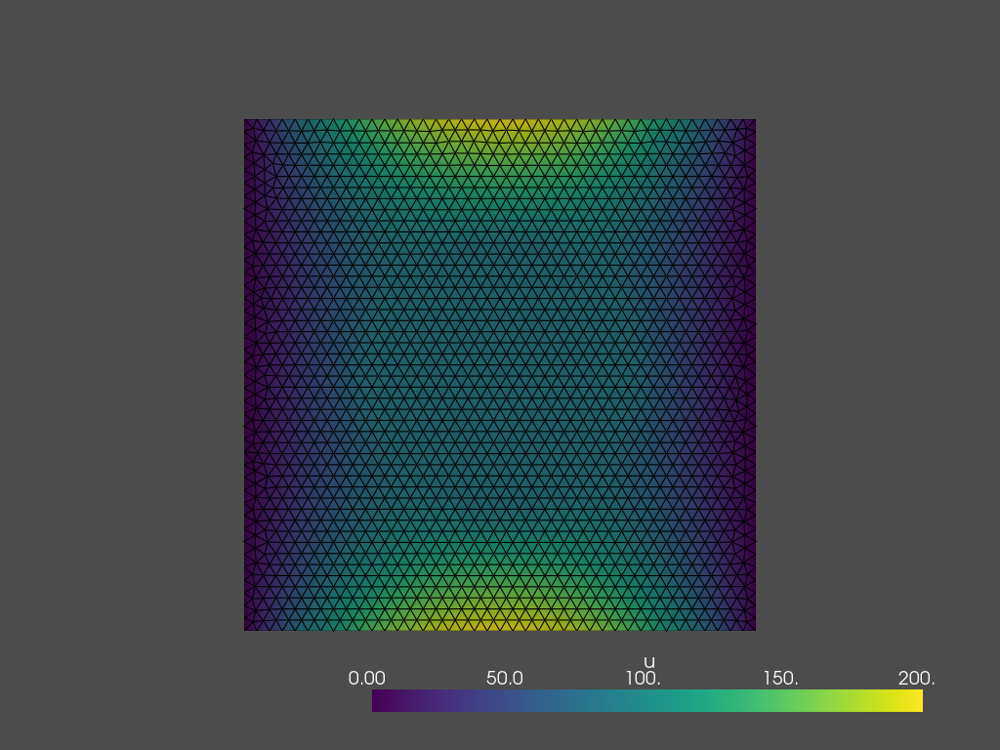

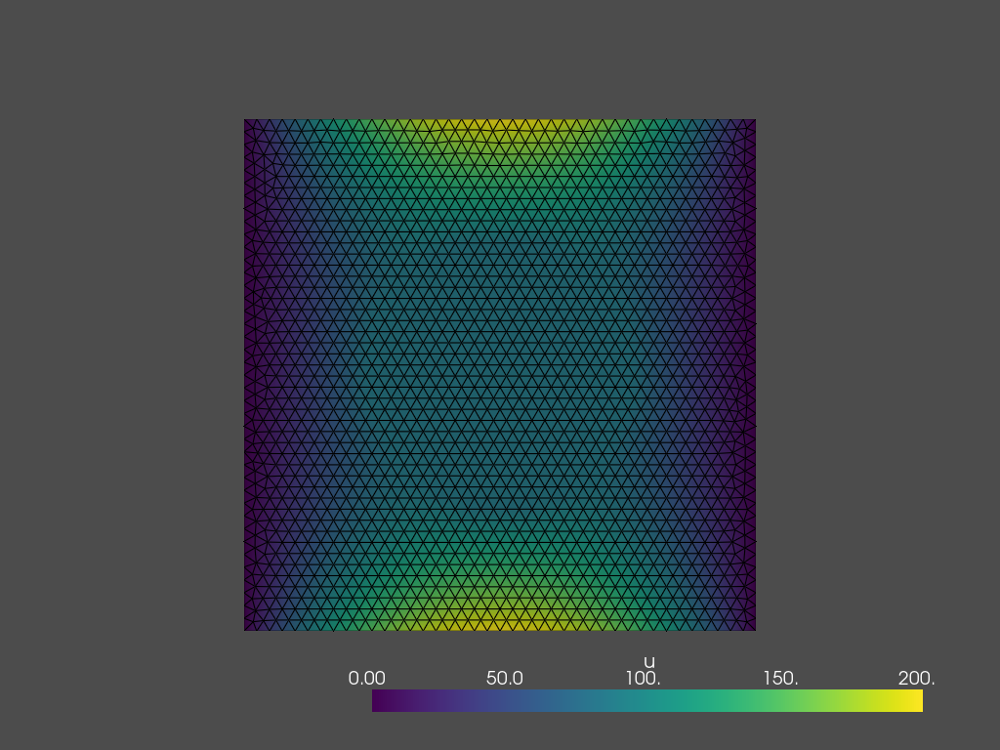

In [33]:
a2_crecientes=[50,1000,50000,500000000]
for k in a2_crecientes:
  resolver_p3(0,0,1,k,0.5, 0.05)

#### Comentario:
Se puede observar que a medida que $a_2$ va tendiendo a $0$, las zonas con color amarillo (valores grandes de $u$) se extienden verticalmente hasta las cercanías del centro del dominio $\Omega_1$, mientras que las zonas oscuras (valores bajos de $u$) se expanden horizontalmente hacia el centro del dominio $\Omega_1$, quedando el dominio dividido en zonas valores grandes de $u$ y valores pequeños de $u$. 

Esto se puede interpretar a que como $a_2$ es pequeño, existe una mayor transferencia de calor en el material del dominio, por lo tanto se puede observar que tanto las fuentes de calor ubicadadas en los bordes superior e inferior transfieren calor hacia el centro, como también  desde el centro del dominio se transfiere calor hacia las zonas frías de los bordes laterales.

Por otro lado, se puede observar un efecto contrario cuando $a_2$ tiende a infinito, pues al ser $a_2$ grande, existe una menor transferencia de calor en el material del dominio, lo que se ve reflejado en que las zonas amarillas (valores altos de $u$) se concentran exclusivamente en los bordes superior e inferior y las zonas azules (valores bajos de $u$) se concentran en los bordes laterales (ambas situaciones debido a las condiciones de borde respectivas), mientras que el centro del dominio se encuentra con valores medianos para $u$ (lo que se representa en verde).